## Depencies

In [2]:
%pip install numpy
%pip install matplotlib


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
from math import *
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

## Leg Mechanism

In [5]:
class LegBase:
  def __init__(self, angle0_init=2*np.pi/3, angle5_init=np.pi/3):
    self.L0 = 8.16
    self.L1 = 8.0
    self.L2 = 10.0
    self.L3 = 8.0
    self.L4 = 13.0
    self.L5 = 8.0
    self.angle0 = angle0_init
    self.angle5 = angle5_init

## Kinematics Analysis in $R^2$

In [86]:
class LegKinematics2D(LegBase):
  def __init__(self):
    super().__init__()

  def calc_ang2pnt(self, angle0, angle5):
    '''
    Forward kinematics
    Given the angles of the motors, calculate the state of the leg, including the position of the points and the angles of the joints
    Return the points and angles of the joints
    '''
    p0 = np.array([0, 0])
    p1 = np.array([self.L1*cos(angle0), -self.L1*sin(angle0)])
    p5 = np.array([self.L0, 0])
    p4 = np.array([self.L5*cos(angle5), -self.L5*sin(angle5)]) + p5
    L14 = np.linalg.norm(p4-p1)

    if(L14 > self.L4 + self.L2):
      print("Unreachable")
      return None
    elif (L14 == self.L4 + self.L2):
      print("Singularity")

    angle_214 = acos((self.L2**2 + L14**2 - self.L4**2) / (2 * self.L2 * L14))
    rotation_matrix1 = np.array([[np.cos(angle_214), -np.sin(angle_214)],
                                [np.sin(angle_214), np.cos(angle_214)]])
    rotation_matrix2 = np.array([[np.cos(-angle_214), -np.sin(-angle_214)],
                                [np.sin(-angle_214), np.cos(-angle_214)]])
    
    unit_vector_14 = (p4 - p1) / L14
    p2_1 = p1 + self.L2 * rotation_matrix1 @ unit_vector_14
    p2_2 = p1 + self.L2 * rotation_matrix2 @ unit_vector_14
    p2 = p2_1 if p2_1[1] < p2_2[1] else p2_2

    # Translate p2 to p3
    p3 = p2 + (p2-p1) / np.linalg.norm(p2-p1) * self.L3

    angle1 = acos((p2-p1)[0] / np.linalg.norm(p2-p1))
    angle4 = acos((p2-p4)[0] / np.linalg.norm(p2-p4))

    # Store the states
    points = np.array([p0, p1, p2, p3, p4, p5])

    angles = np.array([
      angle0,
      angle1,
      None, # angle2
      None, # angle3
      angle4,
      angle5
    ])

    return points, angles
  
  def calc_pnt2ang(self, x, y):
    '''
    Calculate the inverse kinematics using the geometric method.
    Given the position of the foot, calculate the angles of the motors,
    Return the angles of the motors, which are p0 and p5.
    '''

    # Calculate the angle of the motor 0
    L03 = np.linalg.norm(np.array([x, y]))
    angle_305 = atan2(-y, x)
    if angle_305 < 0:
      angle_305 += np.pi
    angle_301 = acos((self.L1**2 + L03**2 - (self.L2 + self.L3)**2) / (2 * self.L1 * L03))
    angle0 = angle_305 + angle_301

    p1 = np.array([self.L1*cos(angle0), -self.L1*sin(angle0)])
    p2 = (np.array([x, y]) * self.L2 + p1 * self.L3) / (self.L2 + self.L3)
    p5 = np.array([self.L0, 0])

    # Calculate the angle of the motor 5
    L25 = np.linalg.norm(p2 - p5)
    angle_250 = atan2(-p2[1], self.L0 - p2[0])
    if angle_250 < 0:
      angle_250 += np.pi
    angle_254 = acos((L25**2 + self.L5**2 - self.L4**2) / (2 * L25 * self.L5))
    angle5 = np.pi - (angle_250 + angle_254)

    # Store the states
    p0 = np.array([0, 0])
    p3 = p2 + (p2-p1) / np.linalg.norm(p2-p1) * self.L3
    p4 = np.array([self.L5*cos(angle5), -self.L5*sin(angle5)]) + p5

    angle1 = acos((p2-p1)[0] / np.linalg.norm(p2-p1))
    angle4 = acos((p2-p4)[0] / np.linalg.norm(p2-p4))

    points = np.array([p0, p1, p2, p3, p4, p5])

    angles = np.array([
      angle0,
      angle1,
      None, # angle2
      None, # angle3
      angle4,
      angle5
    ])

    return angles, points

  def calc_omg2vel(self, omega0, omega5, angles):
    '''
    Calculate the velocity of the foot given the angular velocity of the motors
    '''
    a = self.L1 * sin(angles[0])
    b = -self.L5 * sin(angles[5])
    c = -self.L2 * sin(angles[1])
    d = self.L4 * sin(angles[4])
    e = self.L1 * cos(angles[0])
    f = -self.L5 * cos(angles[5])
    g = -self.L2 * cos(angles[1])
    h = self.L4 * cos(angles[4])
    omega1 = omega0 * (a*h-e*d) / (c*h-d*g) + omega5 * (b*h-f*d) / (c*h-d*g)

    vx2 = -self.L1 * omega0 * sin(angles[0]) - self.L2 * omega1 * sin(angles[1])
    vy2 = -self.L1 * omega0 * cos(angles[0]) - self.L2 * omega1 * cos(angles[1])

    vx3 = vx2 - self.L3 * omega1 * sin(angles[1])
    vy3 = vy2 - self.L3 * omega1 * cos(angles[1])
    
    return vx3, vy3

  def calc_vel2omg(self, vx3, vy3, point3):
    '''
    Calculate the angular velocity of the motors given the velocity and position of the foot
    '''
    angles, points = self.calc_pnt2ang(point3[0], point3[1])
    a = self.L1 * sin(angles[0])
    b = -self.L5 * sin(angles[5])
    c = -self.L2 * sin(angles[1])
    d = self.L4 * sin(angles[4])
    e = self.L1 * cos(angles[0])
    f = -self.L5 * cos(angles[5])
    g = -self.L2 * cos(angles[1])
    h = self.L4 * cos(angles[4])

    i = -self.L1 * sin(angles[0]) - (self.L2 + self.L3) * sin(angles[1]) * (a*h-e*d) / (c*h-d*g)
    j = -sin(angles[1]) * (self.L2 + self.L3) * (b*h-f*d) / (c*h-d*g) 
    k = -self.L1 * cos(angles[0]) - (self.L2 + self.L3) * cos(angles[1]) * (a*h-e*d) / (c*h-d*g)
    l = -cos(angles[1]) * (self.L2 + self.L3) * (b*h-f*d) / (c*h-d*g)

    omega0 = (l * vx3 - j * vy3) / (i * l - j * k)
    omega5 = (-k * vx3 + i * vy3) / (i * l - j * k)

    return omega0, omega5

### Check if inverse kinematics fits the forward kinematics

In [87]:
legkinematics = LegKinematics2D()
angle0, angle5 = 2*np.pi/3, np.pi/3
print("Forward kinematics")
print("Given Angles: ", angle0, angle5)

points, angles = legkinematics.calc_ang2pnt(angle0, angle5)
print("Points: ", points)

print("\nInverse kinematics")
angles, points = legkinematics.calc_pnt2ang(points[3][0], points[3][1])
print("Given Point: ", points[3])
print("Angle0: ", angles[0], ", Angle5: ", angles[5])

Forward kinematics
Given Angles:  2.0943951023931953 1.0471975511965976
Points:  [[  0.           0.        ]
 [ -4.          -6.92820323]
 [  1.94509901 -14.96908613]
 [  6.70117822 -21.40179244]
 [ 12.16        -6.92820323]
 [  8.16         0.        ]]

Inverse kinematics
Given Point:  [  6.70117822 -21.40179244]
Angle0:  2.0943951023931957 , Angle5:  1.0471975511965979


### Check if omg2vel and vel2omg are consistent

In [88]:
legkinematics = LegKinematics2D()

# Given omegas and angles
omg0, omg5 = -0.5, -1
angle0, angle5 = 2*np.pi/3, np.pi/3

print("\nVelocity calculation")
print("Given Omega0: ", omg0, ", Omega5: ", omg5)
print("Given Angle0: ", angle0, ", Angle5: ", angle5)
points, angles = legkinematics.calc_ang2pnt(angle0, angle5)
vx, vy = legkinematics.calc_omg2vel(omg0, omg5, angles)
print("Velocity: ", vx, vy)

print("\nAngular velocity calculation")
print("Given Velocity: ", vx, vy)
print("Given Point: ", points[3])
angle0, angle5 = legkinematics.calc_pnt2ang(points[3][0], points[3][1])
omega0, omega5 = legkinematics.calc_vel2omg(vx, vy, points[3])
print("Omega0: ", omega0, ", Omega5: ", omega5)


Velocity calculation
Given Omega0:  -0.5 , Omega5:  -1
Given Angle0:  2.0943951023931953 , Angle5:  1.0471975511965976
Velocity:  12.77940819434327 4.887355608917088

Angular velocity calculation
Given Velocity:  12.77940819434327 4.887355608917088
Given Point:  [  6.70117822 -21.40179244]
Omega0:  -0.4999999999999999 , Omega5:  -0.9999999999999999


### Visualize the 2D leg model

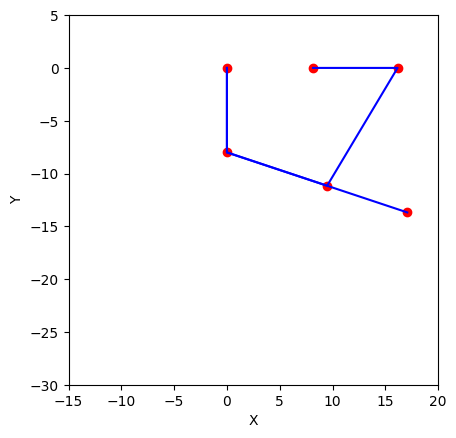

In [89]:
fig = plt.figure()
ax = fig.add_subplot(111)

# Initialize the points and lines
legkinematics = LegKinematics2D()
points = np.zeros((6, 2))  # 6 points in 2D
scat = ax.scatter(points[:, 0], points[:, 1], color='r')
line1, = ax.plot([], [], color='b') # Line p0 -> p1 -> p2 -> p4 -> p5
line2, = ax.plot([], [], color='b') # Line p2 -> p3

# Update function for animation
angle0 = np.linspace(np.pi, np.pi/2, 200)
angle5 = np.linspace(np.pi/2, 0, 200)

def update(frame):
  ang0 = angle0[frame]
  ang5 = angle5[frame]
  points[:6] = legkinematics.calc_ang2pnt(ang0, ang5)[0]

  # Update scatter plot
  scat.set_offsets(points)

  # Update lines
  line1.set_data(points[[0, 1, 2, 3], 0], points[[0, 1, 2, 3], 1])
  line2.set_data(points[[0, 1, 2, 4, 5], 0], points[[0, 1, 2, 4, 5], 1])

  return scat, line1, line2

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim([-15, 20])
ax.set_ylim([-30, 5])
ax.set_aspect('equal')

ani = FuncAnimation(fig, update, frames=200, interval=20, blit=True)
HTML(ani.to_jshtml())

### Check if omg2vel fit the actual velocity

In [90]:
class LegVisualizer:
    def __init__(self):
        self.fig, (self.ax_mech, self.ax_vel) = plt.subplots(1, 2, figsize=(15, 5))

        # Set up axes
        self.ax_mech.set_xlim(-15, 20)
        self.ax_mech.set_ylim(-30, 5)
        self.ax_mech.set_aspect('equal')
        self.ax_mech.grid(True)
        self.ax_mech.set_title('Leg Mechanism')
        # self.ax_mech.legend()
        
        self.ax_vel.set_xlim(0, 2)  # Match your total_time
        self.ax_vel.set_ylim(-20, 20)
        self.ax_vel.grid(True)
        self.ax_vel.set_title('P3 Velocity Components')
        self.ax_vel.set_xlabel('Time (s)')
        self.ax_vel.set_ylabel('Velocity')
        # self.ax_vel.legend()

        # Data storage
        self.times = []
        self.actual_velocities = []
        self.calculated_velocities = []
        self.points_history = []

        # Initialize empty lines for the mechanism
        self.line1, = self.ax_mech.plot([], [], 'blue', lw=2, label='Chain 1')
        self.line2, = self.ax_mech.plot([], [], 'blue', lw=2, label='Chain 2')
        self.joints, = self.ax_mech.plot([], [], 'ro', label='Joints')
        self.calc_vector = self.ax_mech.quiver([], [], [], [], color='r', scale=1, units="xy")
        self.actual_vector = self.ax_mech.quiver([], [], [], [], color='g', scale=1, units="xy")

        # Initialize velocity plot lines
        self.vx_actual, = self.ax_vel.plot([], [], 'b-', label='Vx')
        self.vy_actual, = self.ax_vel.plot([], [], 'g-', label='Vy')
        self.vx_calc, = self.ax_vel.plot([], [], 'r-', label='Vx Calc')
        self.vy_calc, = self.ax_vel.plot([], [], 'y-', label='Vy Calc')
        
    def update(self, frame):
        points = self.points_history[frame]
        
        # Update chain
        self.line1.set_data(points[[0, 1, 2, 3], 0], points[[0, 1, 2, 3], 1])
        self.line2.set_data(points[[0, 5, 4, 2], 0], points[[0, 5, 4, 2], 1])
        self.joints.set_data(points[:, 0], points[:, 1])

        # Update velocity vector at p3
        if frame > 0:
            actual_vel = self.actual_velocities[frame]
            calc_vel = self.calculated_velocities[frame]

           # Plot velocity vector
            self.calc_vector.set_offsets(points[3])
            self.calc_vector.set_UVC(calc_vel[0], calc_vel[1])
            self.actual_vector.set_offsets(points[3])
            self.actual_vector.set_UVC(actual_vel[0], actual_vel[1])
            
        # Plot velocity components over time
        time = self.times[:frame+1]
        actual_vx = [v[0] for v in self.actual_velocities[:frame+1]]
        actual_vy = [v[1] for v in self.actual_velocities[:frame+1]]
        calc_vx = [v[0] for v in self.calculated_velocities[:frame+1]]
        calc_vy = [v[1] for v in self.calculated_velocities[:frame+1]]

        self.vx_actual.set_data(time, actual_vx)
        self.vy_actual.set_data(time, actual_vy)
        self.vx_calc.set_data(time, calc_vx)
        self.vy_calc.set_data(time, calc_vy)

        return self.line1, self.line2, self.joints
        
    def animate(self, points_history, times, actual_velocities, calculated_velocities):
        self.points_history = points_history
        self.times = times
        self.actual_velocities = actual_velocities
        self.calculated_velocities = calculated_velocities
        
        anim = FuncAnimation(self.fig, self.update,
                           frames=len(times), 
                           interval=50,
                           blit=True)
        
        plt.tight_layout()
        return HTML(anim.to_jshtml())

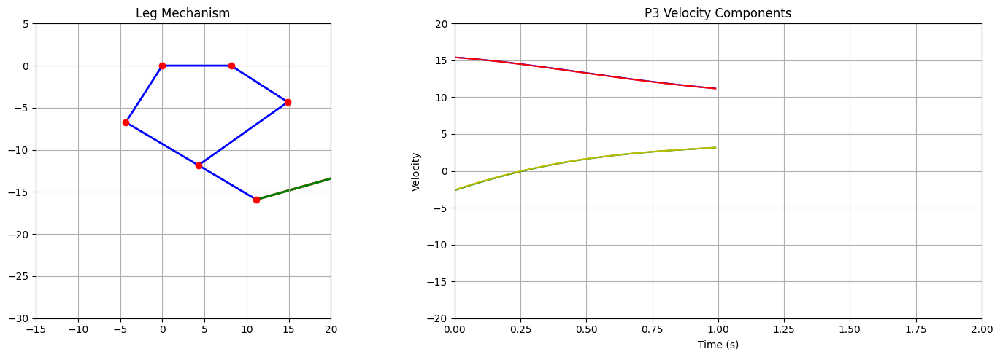

In [91]:
# Initialize the visualizer
visualizer = LegVisualizer()
points_history = []
times = []
actual_velocities = []
calc_velocities = []

# Time variables
time = 0
dt = 0.01
total_time = 1

# Initial points
angle0, angle5 = np.pi, np.pi/2
omega0, omega5 = -1, -1
prev_points, _ = legkinematics.calc_ang2pnt(angle0, angle5)

while time < total_time:
  # Update the angles
  angle0 = (angle0 + omega0 * dt) % (2*np.pi)
  angle5 = (angle5 + omega5 * dt) % (2*np.pi)

  # Forwards kinematics
  points, angles = legkinematics.calc_ang2pnt(angle0, angle5)

  calc_p3_velocity = legkinematics.calc_omg2vel(omega0, omega5, angles)
  actual_p3_velocity = (points[3] - prev_points[3]) / dt

  # Store data
  points_history.append(points)
  times.append(time)
  actual_velocities.append(actual_p3_velocity)
  calc_velocities.append(calc_p3_velocity)

  prev_points = points
  time += dt

animation = visualizer.animate(points_history, times, actual_velocities, calc_velocities)
display(animation)

## Kinematics Analysis in $R^3$

Now, we will work on the 3D leg model, expanding the previous analysis to general 3D space.

In [53]:
class LegKinematics(LegBase):
  def __init__(self):
    super().__init__()

  def calc_ang2pnt(self, angle0, angle5, angle6):
    '''
    Forward kinematics
    Given the angles of the motors, calculate the state of the leg, including the position of the points and the angles of the joints
    Return the points and angles of the joints
    '''
    # Start from 2D kinematics
    p0 = np.array([0, 0])
    p1 = np.array([self.L1*cos(angle0), -self.L1*sin(angle0)])
    p5 = np.array([self.L0, 0])
    p4 = np.array([self.L5*cos(angle5), -self.L5*sin(angle5)]) + p5
    L14 = np.linalg.norm(p4-p1)

    if(L14 > self.L4 + self.L2):
      print("Unreachable")
      return None
    elif (L14 == self.L4 + self.L2):
      print("Singularity")

    angle_214 = acos((self.L2**2 + L14**2 - self.L4**2) / (2 * self.L2 * L14))
    rotation_matrix1 = np.array([[np.cos(angle_214), -np.sin(angle_214)],
                                [np.sin(angle_214), np.cos(angle_214)]])
    rotation_matrix2 = np.array([[np.cos(-angle_214), -np.sin(-angle_214)],
                                [np.sin(-angle_214), np.cos(-angle_214)]])
    
    unit_vector_14 = (p4 - p1) / L14
    p2_1 = p1 + self.L2 * rotation_matrix1 @ unit_vector_14
    p2_2 = p1 + self.L2 * rotation_matrix2 @ unit_vector_14
    p2 = p2_1 if p2_1[1] < p2_2[1] else p2_2

    # Translate p2 to p3
    p3 = p2 + (p2-p1) / np.linalg.norm(p2-p1) * self.L3

    angle1 = acos((p2-p1)[0] / np.linalg.norm(p2-p1))
    angle4 = acos((p2-p4)[0] / np.linalg.norm(p2-p4))

    # Store the 2D states
    points = np.array([p0, p1, p2, p3, p4, p5])

    # Translate points from 2D to 3D
    offset_angle = np.pi/2 - angle6 # Rotate the current plane to the x-y plane
    transformation_matrix = np.array([
      [1, 0, 0],
      [0, cos(offset_angle), -sin(offset_angle)],
      [0, sin(offset_angle), cos(offset_angle)]
    ])
    points = np.concatenate([points, np.zeros((6, 1))], axis=1)
    points = points @ transformation_matrix

    angles = np.array([
      angle0,
      angle1,
      None, # angle2
      None, # angle3
      angle4,
      angle5,
      angle6
    ])

    return points, angles
  
  def calc_pnt2ang(self, x, y, z):
    '''
    Calculate the inverse kinematics using the geometric method.
    Given the position of the foot, calculate the angles of the motors,
    Return the angles of the motors, which are p0 and p5.
    '''

    angle6 = atan2(z, -y)
    if angle6 < 0:
      angle6 += np.pi

    # Translate the points from 3D to 2D
    offset_angle = angle6 - np.pi/2
    transformation_matrix = np.array([
      [1, 0, 0],
      [0, cos(offset_angle), -sin(offset_angle)],
      [0, sin(offset_angle), cos(offset_angle)]
    ])
    points = np.array([x, y, z]) @ transformation_matrix

    # Calculate the angle of the motor 0
    L03 = np.linalg.norm(np.array([x, y]))
    angle_305 = atan2(-y, x)
    if angle_305 < 0:
      angle_305 += np.pi
    angle_301 = acos((self.L1**2 + L03**2 - (self.L2 + self.L3)**2) / (2 * self.L1 * L03))
    angle0 = angle_305 + angle_301

    p1 = np.array([self.L1*cos(angle0), -self.L1*sin(angle0)])
    p2 = (np.array([x, y]) * self.L2 + p1 * self.L3) / (self.L2 + self.L3)
    p5 = np.array([self.L0, 0])

    # Calculate the angle of the motor 5
    L25 = np.linalg.norm(p2 - p5)
    angle_250 = atan2(-p2[1], self.L0 - p2[0])
    if angle_250 < 0:
      angle_250 += np.pi
    angle_254 = acos((L25**2 + self.L5**2 - self.L4**2) / (2 * L25 * self.L5))
    angle5 = np.pi - (angle_250 + angle_254)

    # Store the states
    p0 = np.array([0, 0])
    p3 = p2 + (p2-p1) / np.linalg.norm(p2-p1) * self.L3
    p4 = np.array([self.L5*cos(angle5), -self.L5*sin(angle5)]) + p5

    angle1 = acos((p2-p1)[0] / np.linalg.norm(p2-p1))
    angle4 = acos((p2-p4)[0] / np.linalg.norm(p2-p4))

    points = np.array([p0, p1, p2, p3, p4, p5])
    points = np.concatenate([points, np.zeros((6, 1))], axis=1)
    transformation_matrix = np.array([
      [1, 0, 0],
      [0, cos(-offset_angle), -sin(-offset_angle)],
      [0, sin(-offset_angle), cos(-offset_angle)]
    ])
    points = np.array([x, y, z]) @ transformation_matrix

    angles = np.array([
      angle0,
      angle1,
      None, # angle2
      None, # angle3
      angle4,
      angle5,
      angle6
    ])

    return angles, points

  def calc_omg2vel(self, omega0, omega5, angles):
    '''
    Calculate the velocity of the foot given the angular velocity of the motors
    '''
    a = self.L1 * sin(angles[0])
    b = -self.L5 * sin(angles[5])
    c = -self.L2 * sin(angles[1])
    d = self.L4 * sin(angles[4])
    e = self.L1 * cos(angles[0])
    f = -self.L5 * cos(angles[5])
    g = -self.L2 * cos(angles[1])
    h = self.L4 * cos(angles[4])
    omega1 = omega0 * (a*h-e*d) / (c*h-d*g) + omega5 * (b*h-f*d) / (c*h-d*g)

    vx2 = -self.L1 * omega0 * sin(angles[0]) - self.L2 * omega1 * sin(angles[1])
    vy2 = -self.L1 * omega0 * cos(angles[0]) - self.L2 * omega1 * cos(angles[1])

    vx3 = vx2 - self.L3 * omega1 * sin(angles[1])
    vy3 = vy2 - self.L3 * omega1 * cos(angles[1])
    
    return vx3, vy3

  def calc_vel2omg(self, vx3, vy3, point3):
    '''
    Calculate the angular velocity of the motors given the velocity and position of the foot
    '''
    angles, points = self.calc_pnt2ang(point3[0], point3[1])
    a = self.L1 * sin(angles[0])
    b = -self.L5 * sin(angles[5])
    c = -self.L2 * sin(angles[1])
    d = self.L4 * sin(angles[4])
    e = self.L1 * cos(angles[0])
    f = -self.L5 * cos(angles[5])
    g = -self.L2 * cos(angles[1])
    h = self.L4 * cos(angles[4])

    i = -self.L1 * sin(angles[0]) - (self.L2 + self.L3) * sin(angles[1]) * (a*h-e*d) / (c*h-d*g)
    j = -sin(angles[1]) * (self.L2 + self.L3) * (b*h-f*d) / (c*h-d*g) 
    k = -self.L1 * cos(angles[0]) - (self.L2 + self.L3) * cos(angles[1]) * (a*h-e*d) / (c*h-d*g)
    l = -cos(angles[1]) * (self.L2 + self.L3) * (b*h-f*d) / (c*h-d*g)

    omega0 = (l * vx3 - j * vy3) / (i * l - j * k)
    omega5 = (-k * vx3 + i * vy3) / (i * l - j * k)

    return omega0, omega5

### Verify calc_ang2pnt()

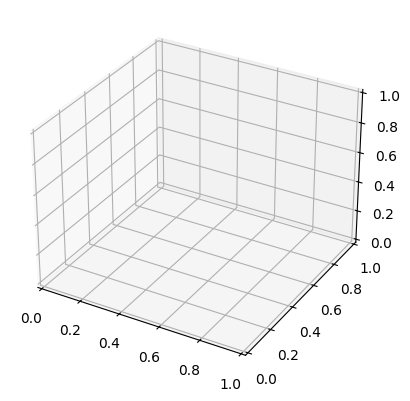

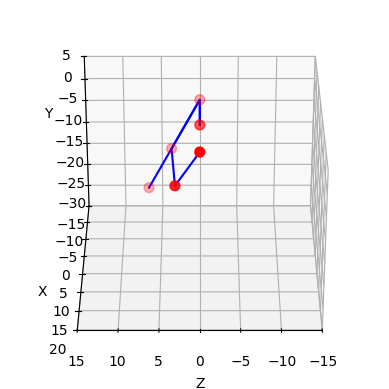

In [56]:
legkinematics = LegKinematics()
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Define animation parameters
N = 100  # Number of frames
angles6 = np.linspace(3*np.pi/8, 5*np.pi/8, N//2)
angles6 = np.concatenate([angles6, angles6[::-1]])  # Oscillate
angles0 = np.linspace(np.pi, np.pi/2, N)
angles5 = np.linspace(np.pi/2, 0, N)

# Create figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim3d([-15, 20])
ax.set_ylim3d([-30, 5])
ax.set_zlim3d([-15, 15])
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# Initialize empty line for animation
line1, = ax.plot([], [], [], 'blue', markersize=5)
line2, = ax.plot([], [], [], 'blue', markersize=5)
scatter = ax.scatter([], [], [], color='red', s=50, label='Joints')

# Animation update function
def update(frame):
    angle0 = angles0[frame]
    angle5 = angles5[frame]
    angle6 = angles6[frame]

    points, _ = legkinematics.calc_ang2pnt(angle0, angle5, angle6)
    if points is not None:
        line1.set_data(points[[0, 1, 2, 3], 0], points[[0, 1, 2, 3], 1])
        line2.set_data(points[[0, 1, 2, 4, 5], 0], points[[0, 1, 2, 4, 5], 1])
        line1.set_3d_properties(points[[0, 1, 2, 3], 2])
        line2.set_3d_properties(points[[0, 1, 2, 4, 5], 2])
        scatter._offsets3d = (points[:, 0], points[:, 1], points[:, 2])
    return line1, line2, scatter

# ax.view_init(vertical_axis='y', azim=30)
ax.view_init(vertical_axis='y', azim=90)
# Run animation
ani = FuncAnimation(fig, update, frames=N, interval=50)
HTML(ani.to_jshtml())

### Verify calc_pnt2ang() and calc_pnt2ang2() are consistent

In [58]:
legkinematics = LegKinematics()

# Given angles
angle0, angle5, angle6 = np.pi, np.pi/2, 3*np.pi/8
print("Forward kinematics")
print("Given Angles: ", angle0, angle5, angle6)
points, angles = legkinematics.calc_ang2pnt(angle0, angle5, angle6)
print("Points: ", points)

print("\nInverse kinematics")
print("Given Point: ", points[3])
angles, points = legkinematics.calc_pnt2ang(points[3][0], points[3][1], points[3][2])
print("Angle0: ", angles[0], ", Angle5: ", angles[5], ", Angle6: ", angles[6])

Forward kinematics
Given Angles:  3.141592653589793 1.5707963267948966 1.1780972450961724
Points:  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-8.00000000e+00 -9.05140890e-16  3.74921632e-16]
 [-4.75777679e+00 -8.73972403e+00  3.62011223e+00]
 [-2.16399823e+00 -1.57315033e+01  6.51620201e+00]
 [ 8.16000000e+00 -7.39103626e+00  3.06146746e+00]
 [ 8.16000000e+00  0.00000000e+00  0.00000000e+00]]

Inverse kinematics
Given Point:  [ -2.16399823 -15.73150326   6.51620201]
Angle0:  3.3091428695986864 , Angle5:  1.5543989070927253 , Angle6:  0.3926990816987242


## Differential Kinematics

### Denavit-Hartenberg(DH) method

$ a_i $: distance between $ O_{i-1} $ and $ O_i $ measured along $ x_{i-1} $  
$ d_i $: distance between $ O_{i-1} $ and $ O_i $ measured along $ z_{i-1} $  
$ \alpha_i $: angle between $ z_{i-1} $ and $ z_i $ measured about $ x_i $ when the rotation is made counterclockwise.  
$ \theta_i $: angle between $ x_{i-1} $ and $ x_i $ measured about $ z_{i-1} $ when the rotation is made counterclockwise.  

### Closed chain structure representation by DH parameters.

1. Select one joint in the chain which is not actuated as cut open.
2. Obtain the open chain
3. Calculate the homogeneous transformation matrix for the open chain
4. Find equality constraints for two frames connected by the cut joint
5. Solve the constraints

### Reference

[YT video - 2.13 D-H parameters of 4-bar parallel robot](https://www.youtube.com/watch?v=oIz5L0VpLQo&t=332s)  
[YT video - Introduction to DH Convention](https://www.youtube.com/watch?v=JSEPoyIypHQ)

### Transformation matrix
$$
T = 
  \begin{bmatrix}
    c\theta & -s\theta & 0 & a \\
    s\theta c\alpha & c\theta c\alpha & -s\alpha & -s\alpha d \\
    s\theta s\alpha & c\theta s\alpha & c\alpha & c\alpha d \\
    0 & 0 & 0 & 1
  \end{bmatrix}
  = 
  \begin{bmatrix}
    R_{3 \times 3} & p_{3 \times 1} \\
    0 & 1
  \end{bmatrix}
$$

In [92]:
# class LegTransforms(LegBase):
#   def __init__(self):
#     super().__init__()
    
#   def get_coordinate_transform(self,a, d, alpha, theta):
#     return np.array([[np.cos(theta), -np.sin(theta)*np.cos(alpha), np.sin(theta)*np.sin(alpha), a*np.cos(theta)],
#                      [np.sin(theta), np.cos(theta)*np.cos(alpha), -np.cos(theta)*np.sin(alpha), a*np.sin(theta)],
#                      [0, np.sin(alpha), np.cos(alpha), d],
#                      [0, 0, 0, 1]])
  
#   def get_transform_matrix(self, angles):
#     A0 = self.get_coordinate_transform(a=self.L0, d=0, alpha=0, theta=0) # base -> 0
#     A1_0 = self.get_coordinate_transform(a=-self.L0, d=0, alpha=0, theta=0) # 0 -> 1
#     A1_1 = self.get_coordinate_transform(a=self.L1, d=0, alpha=0, theta=2*np.pi-angles[0]) # 0 -> 1
#     A2 = self.get_coordinate_transform(a=self.L2, d=0, alpha=0, theta=np.pi-angles[1]) # 1 -> 2
#     A3 = self.get_coordinate_transform(a=self.L3, d=0, alpha=0, theta=0) # 2 -> 3
#     A4 = self.get_coordinate_transform(a=self.L4, d=0, alpha=0, theta=np.pi+angles[4]) # 5 -> 4
#     A5 = self.get_coordinate_transform(a=self.L5, d=0, alpha=0, theta=2*np.pi-angles[5]) # 0 -> 5

#     T0 = A0
#     T1 = A0 @ A1_0 @ A1_1
#     T1 = A1_1 @ A1_2
#     T2 = T1 @ A2
#     T3 = T2 @ A3
#     return [T0, T1, T2, T3, T4, T5]
  
#   def get_jacobian(self, transform_matrix):
#     J_v = []
#     J_w = []
#     z = []
#     p = []

#     for T in transform_matrix:
#       p.append(T[0:3, 3])


#     J = np.vstack((np.array(J_v).T, np.array(J_w).T))
#     return J

In [93]:
# legkinematics = LegKinematics()
# angle0, angle5 = 2*np.pi/3, np.pi/3
# __, angles = legkinematics.calc_forward_kinematics(angle0, angle5)

# legtransforms = LegTransforms()
# transform_matrix = legtransforms.get_transform_matrix(angles)
# for i, T in enumerate(transform_matrix):
#   print(f'Transform matrix {i+1}:')
#   print(T, '\n')

### Transformation matrix

$$
T = \begin{bmatrix}
\cos(\theta) & -\sin(\theta) & 0 & a \\
\sin(\theta)\cos(\alpha) & \cos(\theta)\cos(\alpha) & -\sin(\alpha) & -d\sin(\alpha) \\
\sin(\theta)\sin(\alpha) & \cos(\theta)\sin(\alpha) & \cos(\alpha) & d\cos(\alpha) \\
0 & 0 & 0 & 1
\end{bmatrix}

 = \begin{bmatrix}
R_{11} & R_{12} & R_{13} & p_x \\
R_{21} & R_{22} & R_{23} & p_y \\
R_{31} & R_{32} & R_{33} & p_z \\
0 & 0 & 0 & 1
\end{bmatrix}
$$

### Jacobian matrix

$$
v = J \times \dot{q}
$$

$$
\dot{q} = J^{-1} \times v
$$

$$
J = \begin{bmatrix}
J_{pi} \\
J_{oi}
\end{bmatrix}

= \begin{bmatrix}
z_{i-1} \times (p_n - p_{i-1}) \\
z_{i-1}
\end{bmatrix}
$$
for revolute joint

In [ ]:
angle0, angle5 = leg.get_IK_position(x[-1], y[-1])
points, angles = leg.get_leg_state(angle0, angle5)
transform_matrix = leg.get_transform_matrix(angles)
jacobian = leg.get_jacobian(transform_matrix)
print(jacobian)

## 3D demonstration

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

def gen(n):
    phi = 0
    while phi < 2*np.pi:
        yield np.array([np.cos(phi), np.sin(phi), phi])
        phi += 2*np.pi/n

def update(num, data, line):
    line.set_data(data[:2, :num])
    line.set_3d_properties(data[2, :num])

N = 100
data = np.array(list(gen(N))).T
line, = ax.plot(data[0, 0:1], data[1, 0:1], data[2, 0:1])

# Setting the axes properties
ax.set_xlim3d([-1.0, 1.0])
ax.set_xlabel('X')

ax.set_ylim3d([-1.0, 1.0])
ax.set_ylabel('Y')

ax.set_zlim3d([0.0, 10.0])
ax.set_zlabel('Z')

ani = FuncAnimation(fig, update, N, fargs=(data, line), interval=10000/N, blit=False)
HTML(ani.to_jshtml())